In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import math
import re


from matplotlib_venn import venn2
from matplotlib_venn import venn3





In [2]:
df = pd.read_csv('data/michael_saad/normalized_estimated_dispersion.txt', sep = '\t')
df.columns = 'P' + df.columns.str.strip('Align.sortedByCoord.out.bam').str.lstrip('STAR2.out').str.lstrip('put.')
df = df.replace(0,np.NAN).dropna(axis = 0, how = 'all').fillna(0)

In [3]:
scaler = StandardScaler()
scaler.fit(df.T)
scaled = scaler.transform(df.T)

pca = PCA(n_components = 2)
pca.fit(scaled)

components = pca.transform(scaled)
pca_df = pd.DataFrame(data = components, columns = ['Principal Component 1', 'Principal Component 2'])
pca_df.index = df.columns

pca_df['meta'] = pca_df.index
pca_df[['Passage', "protocol_replicate"]] = pca_df.meta.str.split('_', n = 1, expand = True)
pca_df['Protocol'] = pca_df.protocol_replicate.str[0]
pca_df['Replicate'] = pca_df.protocol_replicate.str[1]
pca_df = pca_df.drop(['meta','protocol_replicate'], axis = 1)
pca_df['Passage_Protocol'] = pca_df.Passage + '_' + pca_df.Protocol

C:\Users\Omen PC\AppData\Local\Temp\ipykernel_10768\487259535.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


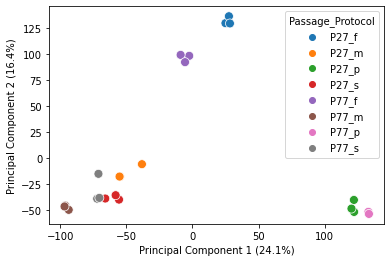

In [4]:
fig = plt.figure()
sns.scatterplot(data = pca_df, x = "Principal Component 1", y = "Principal Component 2", hue = 'Passage_Protocol', s = 80)
plt.xlabel('Principal Component 1 (' + str(round(pca.explained_variance_ratio_[0]*100,1)) + '%)' )
plt.ylabel('Principal Component 2 (' + str(round(pca.explained_variance_ratio_[1]*100,1)) + '%)' )
fig.show()

C:\Users\Omen PC\AppData\Local\Temp\ipykernel_10768\393861570.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


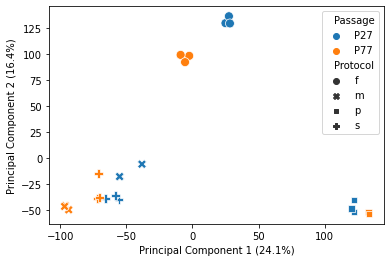

In [5]:
fig = plt.figure()
sns.scatterplot(data = pca_df, x = "Principal Component 1", y = "Principal Component 2", hue = 'Passage', style = 'Protocol', s = 80)
plt.xlabel('Principal Component 1 (' + str(round(pca.explained_variance_ratio_[0]*100,1)) + '%)' )
plt.ylabel('Principal Component 2 (' + str(round(pca.explained_variance_ratio_[1]*100,1)) + '%)' )
fig.show()

C:\Users\Omen PC\AppData\Local\Temp\ipykernel_10768\4249343255.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


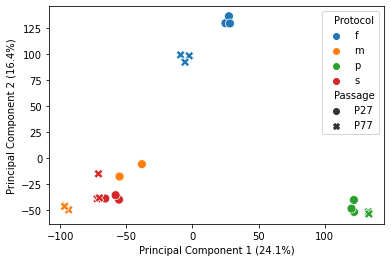

In [6]:
fig = plt.figure()
sns.scatterplot(data = pca_df, x = "Principal Component 1", y = "Principal Component 2", hue = 'Protocol', style = 'Passage', s = 80)
plt.xlabel('Principal Component 1 (' + str(round(pca.explained_variance_ratio_[0]*100,1)) + '%)' )
plt.ylabel('Principal Component 2 (' + str(round(pca.explained_variance_ratio_[1]*100,1)) + '%)' )
fig.show()

In [7]:
fig = px.scatter(pca_df, x = "Principal Component 1", y = "Principal Component 2", symbol = "Protocol", color="Passage", 
           labels = {'Principal Component 1': 'Principal Component 1 (' + str(round(pca.explained_variance_ratio_[0]*100,1)) + '%)',
                     'Principal Component 2': 'Principal Component 2 (' + str(round(pca.explained_variance_ratio_[1]*100,1)) + '%)'})

fig.update_traces(marker={'size': 12})
fig.show()

In [8]:
df_scaled = pd.DataFrame(scaled.T, index = df.index, columns = df.columns)

In [9]:
#sns.clustermap(df_scaled, cmap="PiYG")

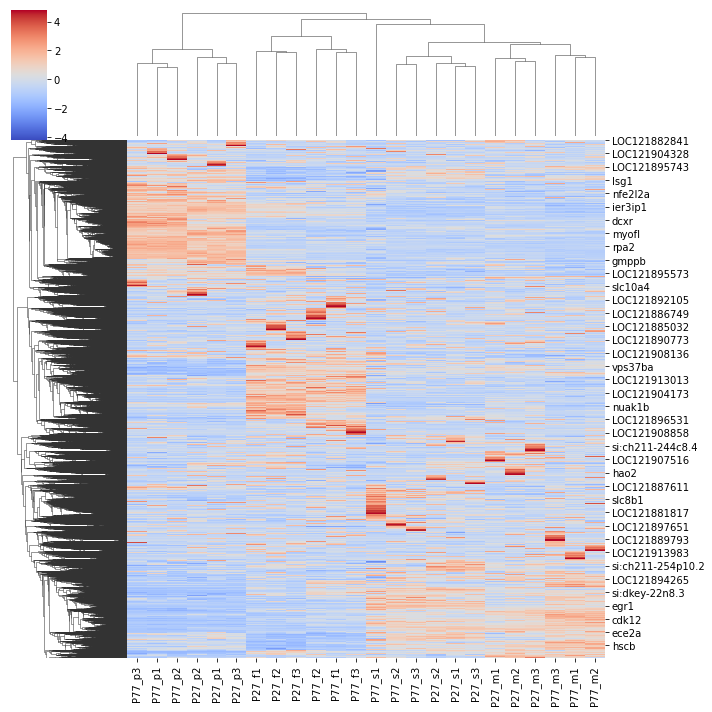

In [10]:
sns.clustermap(df_scaled, cmap = 'coolwarm')

In [11]:
df_pca_loadings = pd.DataFrame(pca.components_.T, columns = ['PC1', 'PC2'], index = df.index)
df_pca_loadings_contribution = pd.DataFrame(pca.components_.T * np.sqrt(pca.explained_variance_), columns = ['PC1', 'PC2'], index = df.index)

PC1_top20 = df_pca_loadings.sort_values(by = ['PC1'], ascending=False).head(20)
PC1_bottom20 = df_pca_loadings.sort_values(by = ['PC1'], ascending=True).head(20)
PC2_top20 = df_pca_loadings.sort_values(by = ['PC2'], ascending=False).head(20)
PC2_bottom20 = df_pca_loadings.sort_values(by = ['PC2'], ascending=True).head(20)

In [12]:
def barplot_goi(search_term):
    # Input: search_term as string; script will search for genes with this string present
    # Output: barplots for genes with search_term in it
    # Process: search for genes of interest then plot just those genes and all samples
    goi = df.index[df.index.str.contains(search_term)]
    for i in goi:
        df_goi = pd.DataFrame(df.loc[i])

        df_goi['meta'] = df_goi.index
        df_goi[['Passage', "protocol_replicate"]] = df_goi.meta.str.split('_', n = 1, expand = True)
        df_goi['Protocol'] = df_goi.protocol_replicate.str[0]
        df_goi['Replicate'] = df_goi.protocol_replicate.str[1]
        df_goi = df_goi.drop(['meta','protocol_replicate'], axis = 1)
        df_goi['Passage_Protocol'] = df_goi.Passage + '_' + df_goi.Protocol    
    
        #fig, a = plt.subplots(len(goi),1,figsize=(12, len(goi)*3),tight_layout=True)
        plt.figure()
        sns.barplot(data = df_goi, x = df_goi.index, y = i, hue = 'Passage', dodge=False)
        plt.xticks(rotation = 90)
        plt.ylabel('Normalized Counts')
        plt.title(i)
        plt.show()
    #fig = df.loc[goi].T.plot.bar(ax = a, subplots = True, legend=False)


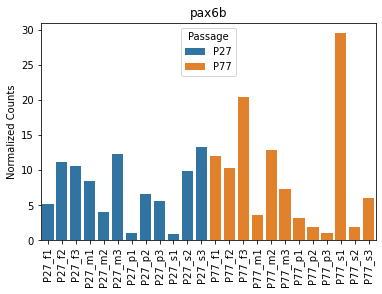

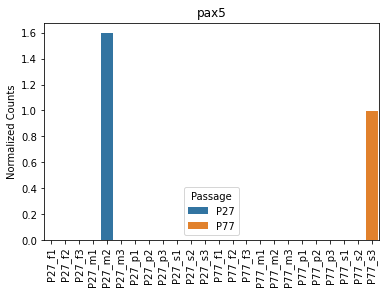

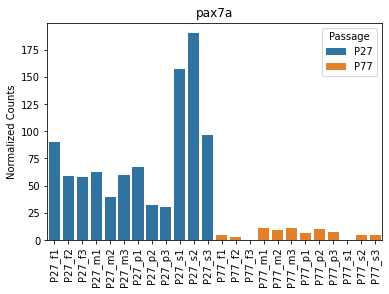

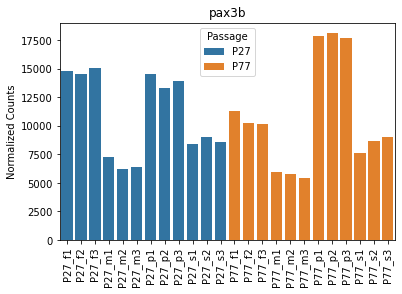

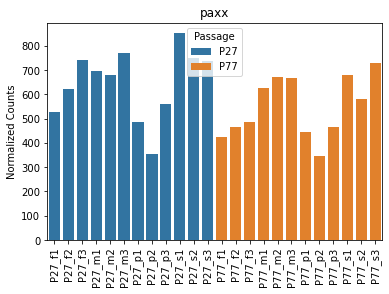

...

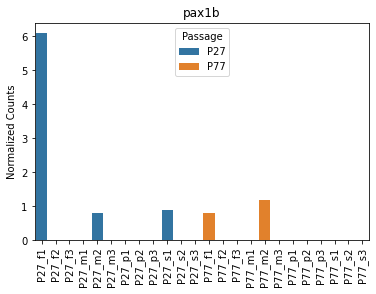

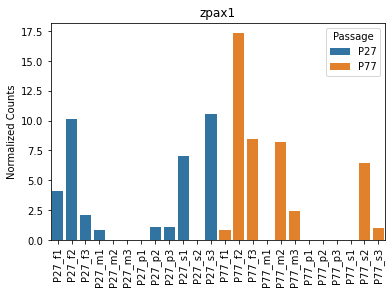

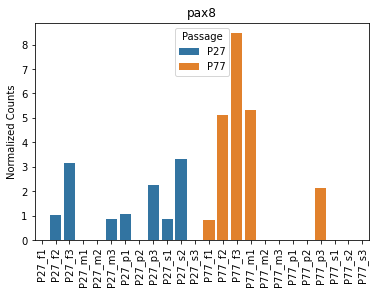

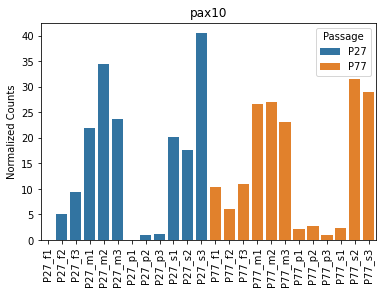

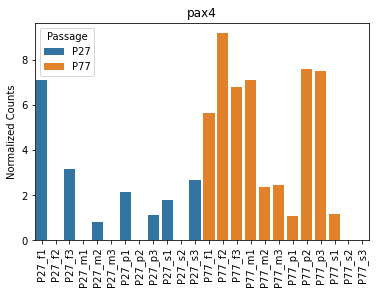

In [13]:
barplot_goi('pax')

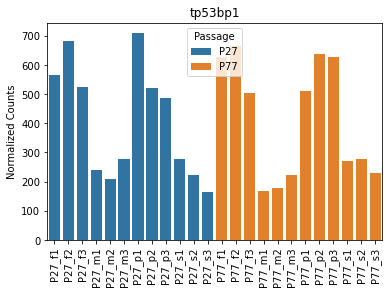

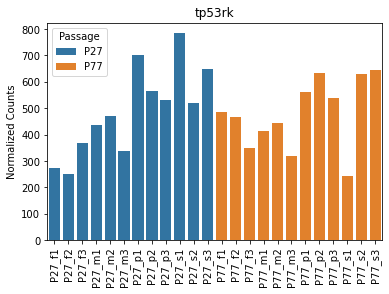

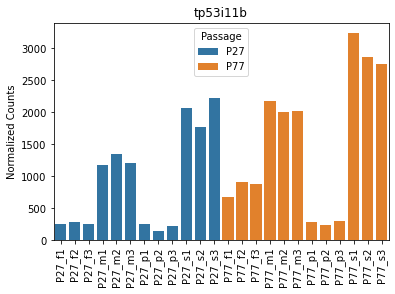

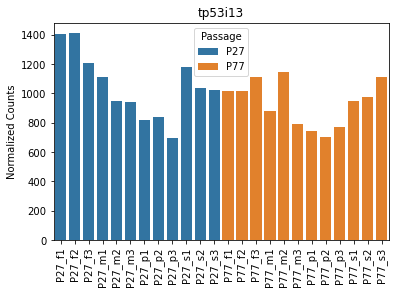

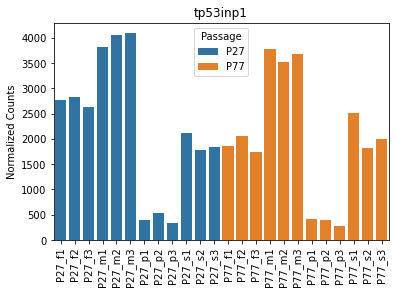

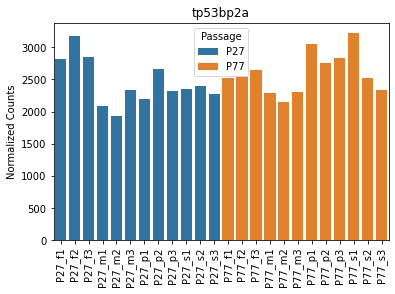

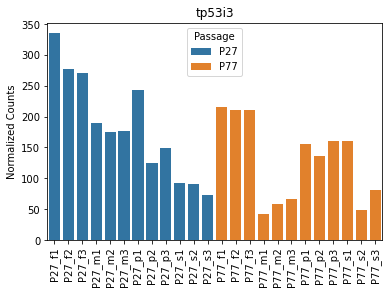

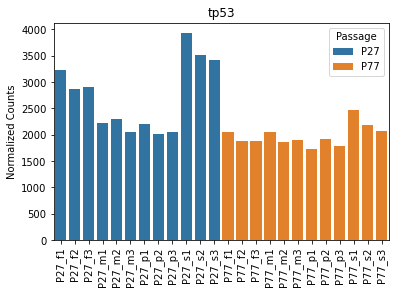

In [14]:
barplot_goi('tp53')

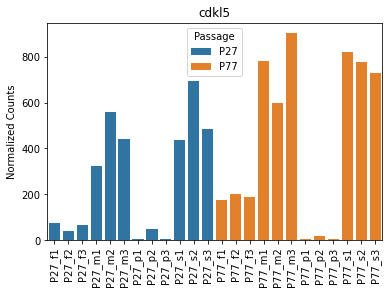

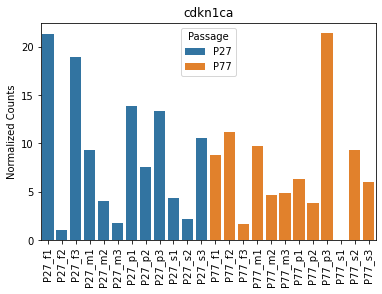

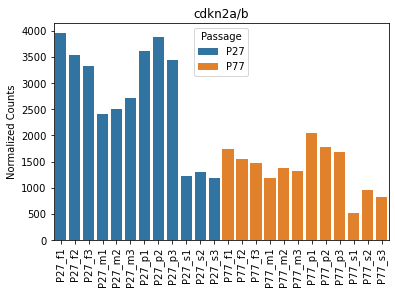

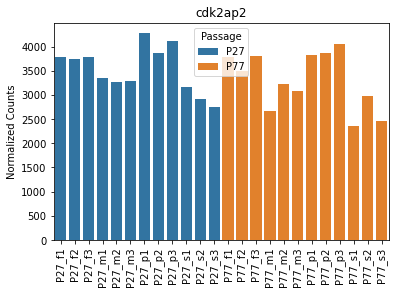

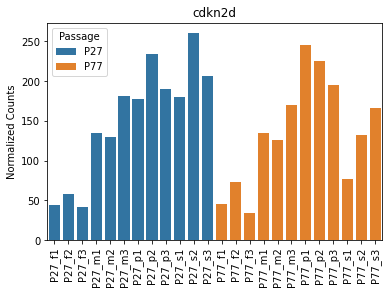

...

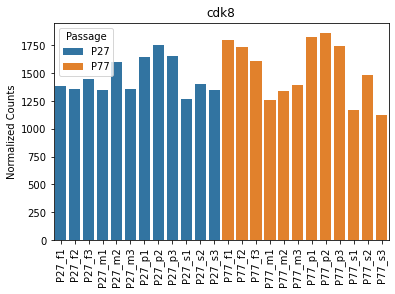

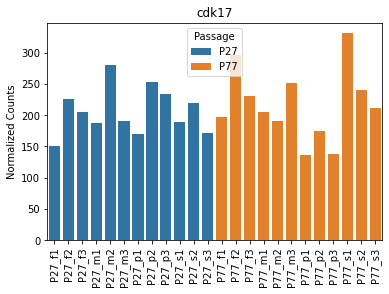

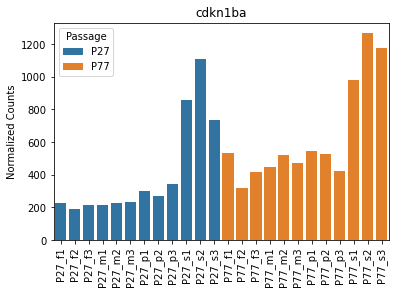

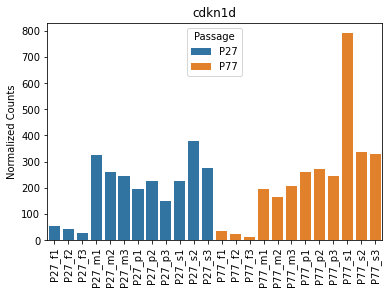

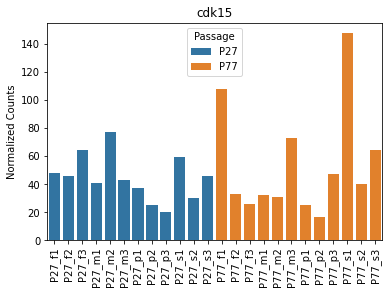

In [15]:
barplot_goi('cdk')

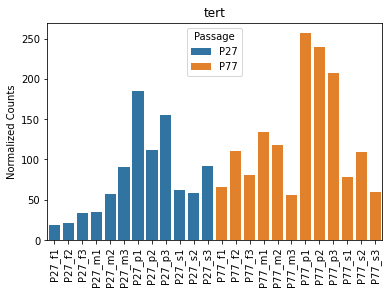

In [16]:
barplot_goi('tert')

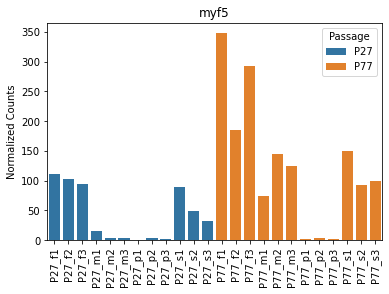

In [17]:
barplot_goi('myf5')

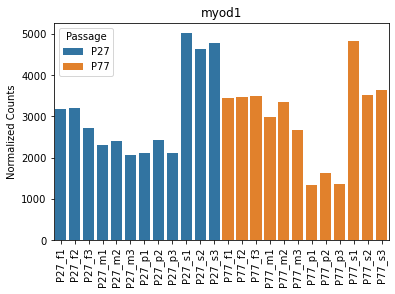

In [18]:
barplot_goi('myod')

In [19]:
# PCA for just P conditions
df_p = df.iloc[:,df.columns.str.contains('_p')]

scaler_p = StandardScaler()
scaler_p.fit(df_p.T)
scaled_p = scaler_p.transform(df_p.T)

pca_p = PCA(n_components = 2)
pca_p.fit(scaled_p)

components_p = pca_p.transform(scaled_p)
pca_df_p = pd.DataFrame(data = components_p, columns = ['Principal Component 1', 'Principal Component 2'])
pca_df_p.index = df_p.columns

pca_df_p['meta'] = pca_df_p.index
pca_df_p[['Passage', "protocol_replicate"]] = pca_df_p.meta.str.split('_', n = 1, expand = True)
pca_df_p['Protocol'] = pca_df_p.protocol_replicate.str[0]
pca_df_p['Replicate'] = pca_df_p.protocol_replicate.str[1]
pca_df_p = pca_df_p.drop(['meta','protocol_replicate'], axis = 1)
pca_df_p['Passage_Protocol'] = pca_df_p.Passage + '_' + pca_df_p.Protocol

C:\Users\Omen PC\AppData\Local\Temp\ipykernel_10768\3439612097.py:5: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



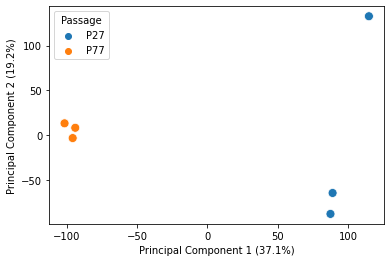

In [20]:
fig = plt.figure()
sns.scatterplot(data = pca_df_p, x = "Principal Component 1", y = "Principal Component 2", hue = 'Passage', s = 80)
plt.xlabel('Principal Component 1 (' + str(round(pca_p.explained_variance_ratio_[0]*100,1)) + '%)' )
plt.ylabel('Principal Component 2 (' + str(round(pca_p.explained_variance_ratio_[1]*100,1)) + '%)' )
fig.show()

In [21]:
df_p_scaled = pd.DataFrame(scaled_p.T, index = df_p.index, columns = df_p.columns)

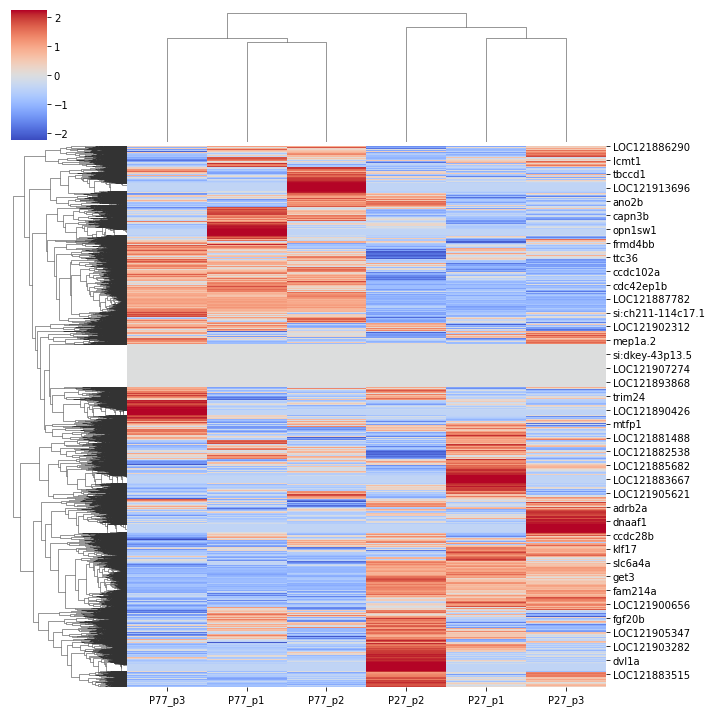

In [22]:
sns.clustermap(df_p_scaled, cmap = 'coolwarm')

In [23]:
df_p_pca_loadings = pd.DataFrame(pca_p.components_.T, columns = ['PC1', 'PC2'], index = df_p.index)
df_p_pca_loadings_contribution = pd.DataFrame(pca_p.components_.T * np.sqrt(pca_p.explained_variance_), columns = ['PC1', 'PC2'], index = df_p.index)

PC1_p_top20 = df_p_pca_loadings.sort_values(by = ['PC1'], ascending=False).head(20)
PC1_p_bottom20 = df_p_pca_loadings.sort_values(by = ['PC1'], ascending=True).head(20)
PC2_p_top20 = df_p_pca_loadings.sort_values(by = ['PC2'], ascending=False).head(20)
PC2_p_bottom20 = df_p_pca_loadings.sort_values(by = ['PC2'], ascending=True).head(20)

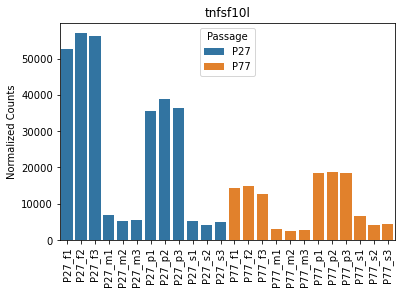

In [24]:
barplot_goi('tnfsf10l')

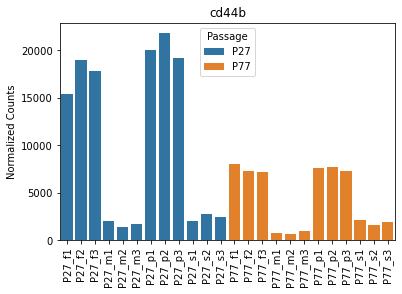

In [25]:
barplot_goi('cd44b')

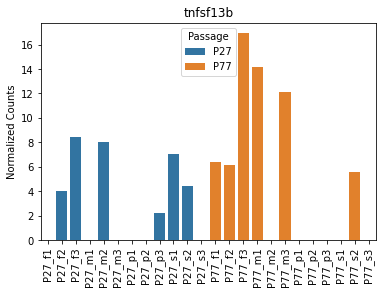

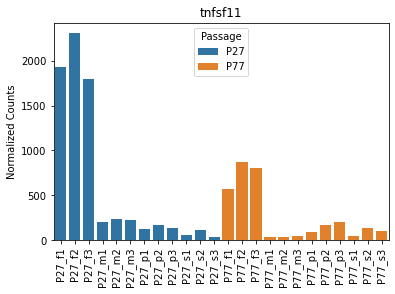

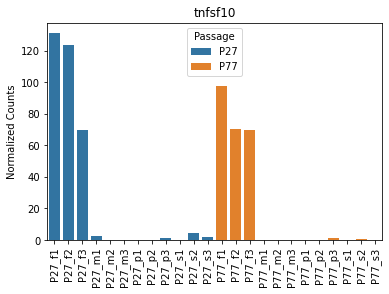

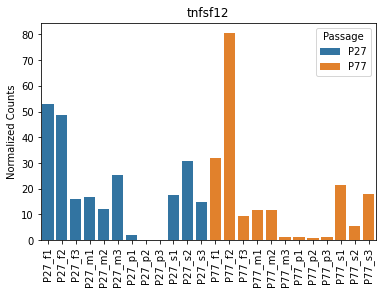

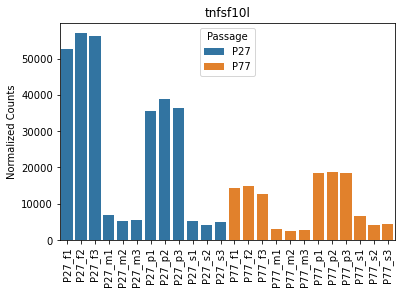

In [26]:
barplot_goi('tnfsf')

# Work from Nico's script data to look at immortalization

In [27]:
def remove_ko(x):
    return " ".join(x.split(' ')[2:])

In [28]:
# Without interaction
df_wo_int_genes = pd.read_csv('output/dataframes/df_wo_int_genes.csv')
df_wo_int_genes = df_wo_int_genes.iloc[:,1:]
df_wo_int_genes['neg_log_p_adj'] = -np.log10(df_wo_int_genes['adj.P.Val'])
df_wo_int_genes['sig'] = (abs(df_wo_int_genes.logFC) > 1) & (df_wo_int_genes.neg_log_p_adj > 2)

df_wo_int_pathways = pd.read_csv('output/dataframes/df_wo_int_pathways.csv')
df_wo_int_pathways = df_wo_int_pathways.iloc[:,1:]

df_wo_int_kegg = pd.read_csv('output/dataframes/df_wo_int_kegg.csv')
df_wo_int_kegg = df_wo_int_kegg.iloc[:,1:]
df_wo_int_kegg.category = df_wo_int_kegg.category.apply(remove_ko)

# Lipid accumulation
df_f_genes = pd.read_csv('output/dataframes/df_f_genes.csv')
df_f_genes = df_f_genes.iloc[:,1:]
df_f_genes['neg_log_p_adj'] = -np.log10(df_f_genes['adj.P.Val'])
df_f_genes['sig'] = (abs(df_f_genes.logFC) > 1) & (df_f_genes.neg_log_p_adj > 2)

df_f_pathways = pd.read_csv('output/dataframes/df_f_pathways.csv')
df_f_pathways = df_f_pathways.iloc[:,1:]

df_f_kegg = pd.read_csv('output/dataframes/df_f_kegg.csv')
df_f_kegg = df_f_kegg.iloc[:,1:]
df_f_kegg.category = df_f_kegg.category.apply(remove_ko)

# Serum reduction for muscle differentiation
df_m_genes = pd.read_csv('output/dataframes/df_m_genes.csv')
df_m_genes = df_m_genes.iloc[:,1:]
df_m_genes['neg_log_p_adj'] = -np.log10(df_m_genes['adj.P.Val'])
df_m_genes['sig'] = (abs(df_m_genes.logFC) > 1) & (df_m_genes.neg_log_p_adj > 2)

df_m_pathways = pd.read_csv('output/dataframes/df_m_pathways.csv')
df_m_pathways = df_m_pathways.iloc[:,1:]

df_m_kegg = pd.read_csv('output/dataframes/df_m_kegg.csv')
df_m_kegg = df_m_kegg.iloc[:,1:]
df_m_kegg.category = df_m_kegg.category.apply(remove_ko)

# Proliferation
df_p_genes = pd.read_csv('output/dataframes/df_p_genes.csv')
df_p_genes = df_p_genes.iloc[:,1:]
df_p_genes['neg_log_p_adj'] = -np.log10(df_p_genes['adj.P.Val'])
df_p_genes['sig'] = (abs(df_p_genes.logFC) > 1) & (df_p_genes.neg_log_p_adj > 2)

df_p_pathways = pd.read_csv('output/dataframes/df_p_pathways.csv')
df_p_pathways = df_p_pathways.iloc[:,1:]

df_p_kegg = pd.read_csv('output/dataframes/df_p_kegg.csv')
df_p_kegg = df_p_kegg.iloc[:,1:]
df_p_kegg.category = df_p_kegg.category.apply(remove_ko)


# Serum starvation for muscle differentiation
df_s_genes = pd.read_csv('output/dataframes/df_s_genes.csv')
df_s_genes = df_s_genes.iloc[:,1:]
df_s_genes['neg_log_p_adj'] = -np.log10(df_s_genes['adj.P.Val'])
df_s_genes['sig'] = (abs(df_s_genes.logFC) > 1) & (df_s_genes.neg_log_p_adj > 2)

df_s_pathways = pd.read_csv('output/dataframes/df_s_pathways.csv')
df_s_pathways = df_s_pathways.iloc[:,1:]

df_s_kegg = pd.read_csv('output/dataframes/df_s_kegg.csv')
df_s_kegg = df_s_kegg.iloc[:,1:]
df_s_kegg.category = df_s_kegg.category.apply(remove_ko)



In [29]:
# How many genes have p_adj below 0.05
print('Signficant genes below 0.05 \n')
print('Without Interaction: ' +  str(sum(df_wo_int_genes['adj.P.Val'] < 0.05)))
print('F Interaction: ' +  str(sum(df_f_genes['adj.P.Val'] < 0.05)))
print('M Interaction: ' +  str(sum(df_m_genes['adj.P.Val'] < 0.05)))
print('P Interaction: ' +  str(sum(df_p_genes['adj.P.Val'] < 0.05)))
print('S Interaction: ' +  str(sum(df_s_genes['adj.P.Val'] < 0.05)))


# How many genes have p_adj below 0.01
print('\n \nSignficant genes below 0.01 \n')
print('Without Interaction: ' +  str(sum(df_wo_int_genes['adj.P.Val'] < 0.01)))
print('F Interaction: ' +  str(sum(df_f_genes['adj.P.Val'] < 0.01)))
print('M Interaction: ' +  str(sum(df_m_genes['adj.P.Val'] < 0.01)))
print('P Interaction: ' +  str(sum(df_p_genes['adj.P.Val'] < 0.01)))
print('S Interaction: ' +  str(sum(df_s_genes['adj.P.Val'] < 0.01)))

# How many genes have p_adj below 0.001
print('\n \nSignficant genes below 0.001 \n')
print('Without Interaction: ' +  str(sum(df_wo_int_genes['adj.P.Val'] < 0.001)))
print('F Interaction: ' +  str(sum(df_f_genes['adj.P.Val'] < 0.001)))
print('M Interaction: ' +  str(sum(df_m_genes['adj.P.Val'] < 0.001)))
print('P Interaction: ' +  str(sum(df_p_genes['adj.P.Val'] < 0.001)))
print('S Interaction: ' +  str(sum(df_s_genes['adj.P.Val'] < 0.001)))

Signficant genes below 0.05 

Without Interaction: 6250
F Interaction: 6206
M Interaction: 5461
P Interaction: 4117
S Interaction: 3944

 
Signficant genes below 0.01 

Without Interaction: 4338
F Interaction: 4473
M Interaction: 3811
P Interaction: 2797
S Interaction: 2289

 
Signficant genes below 0.001 

Without Interaction: 2632
F Interaction: 3059
M Interaction: 2588
P Interaction: 1749
S Interaction: 1301


In [30]:
px.scatter(df_wo_int_genes, x = 'logFC', y = 'neg_log_p_adj', color = "sig", hover_data = ['description'], 
           labels={
                     "logFC": "log2(FC)",
                     "neg_log_p_adj": "-log10(adj. p-value)",
                     "sig": "Significantly expressed"},
            title = 'All Samples',

               color_discrete_sequence=['orange', 'blue'])



In [31]:
px.scatter(df_p_genes, x = 'logFC', y = 'neg_log_p_adj', color = "sig", hover_data = ['description'], 
           labels={
                     "logFC": "log2(FC)",
                     "neg_log_p_adj": "-log10(adj. p-value)",
                     "sig": "Significantly expressed"},
           title = 'Proliferation Samples Only',
            color_discrete_sequence=['orange', 'blue'])

In [32]:
categories = ['Cellular Component','Molecular Function','Biological Process']

def plot_pathways(df, label):    
    for i in categories:
        df_i = df[df.Ontology == i]
        
        plt.figure()
        sns.barplot(data = df_i.sort_values("ratio", ascending=False).head(10), x = 'ratio', y = 'Term', color = 'steelblue').set(ylabel = None)
        plt.title('%s %s: Enriched pathways' % (label,i))
        plt.show()
        
        plt.figure()
        sns.barplot(data = df_i.sort_values("ratio", ascending=True).head(10), x = 'ratio', y = 'Term', color = 'orange').set(ylabel = None)
        plt.title('%s %s: Depleted pathways' % (label,i))
        plt.show()

        plt.figure()
        sns.barplot(data = df_i.sort_values("p.adjust", ascending=True).head(10), x = 'p.adjust', y = 'Term', color = 'steelblue').set(ylabel = None)
        plt.title('%s %s: Most Significantly Enriched Pathways' % (label,i))
        plt.show()

        plt.figure()
        ax = sns.scatterplot(data = df_i.sort_values("ratio", ascending=False).head(10), 
                    x = 'ratio', y = 'Term', size = 'Count', hue = 'p.adjust',sizes=(20, 200), palette = 'flare')
        handles, labels = ax.get_legend_handles_labels()
        new_labels = [label[:5] for label in labels]
        ax.legend(handles, new_labels, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
        ax.set(ylabel = None)
        plt.title('%s %s: Dotplot for Enrichm Pathways' % (label,i))
        plt.show()

        plt.figure()
        ax = sns.scatterplot(data = df_i.sort_values("ratio", ascending=False).head(10), 
                    x = 'p.adjust', y = 'Term', size = 'Count', hue = 'ratio',sizes=(20, 200), palette = 'flare')

        handles, labels = ax.get_legend_handles_labels()
        new_labels = [label[:5] for label in labels]
        ax.legend(handles, new_labels, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
        ax.set(ylabel = None)
        plt.title('%s %s: Dotplot for Enrichm Pathways, p-value on x-axis' % (label,i))
        plt.show()


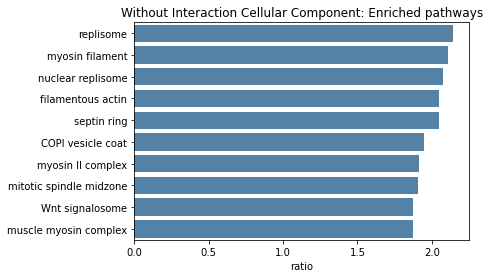

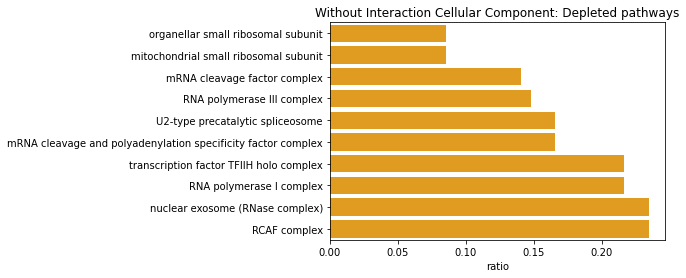

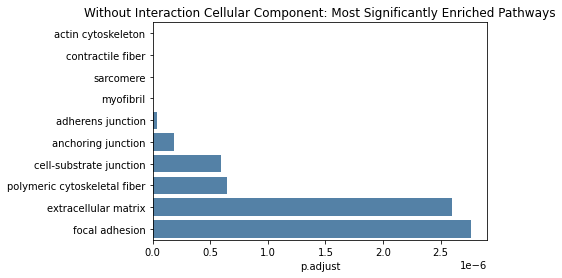

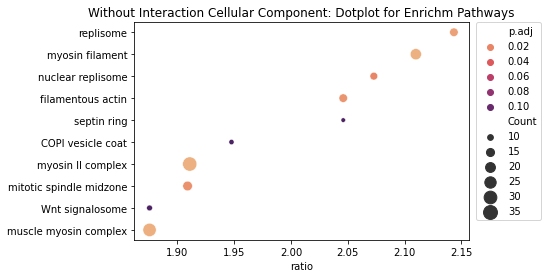

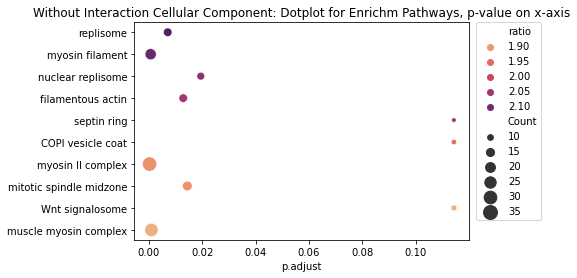

...

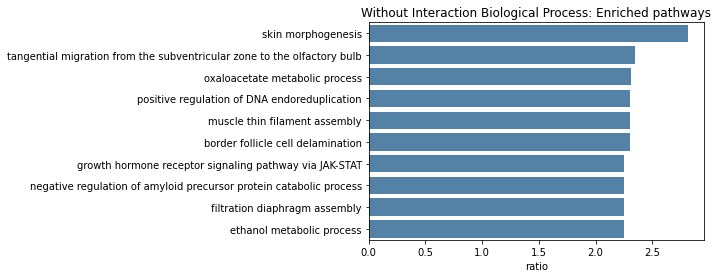

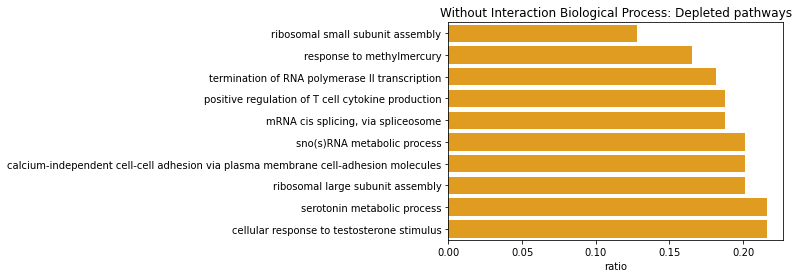

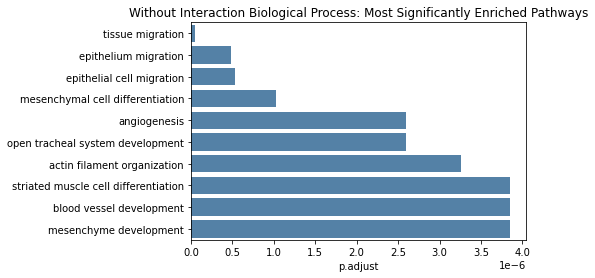

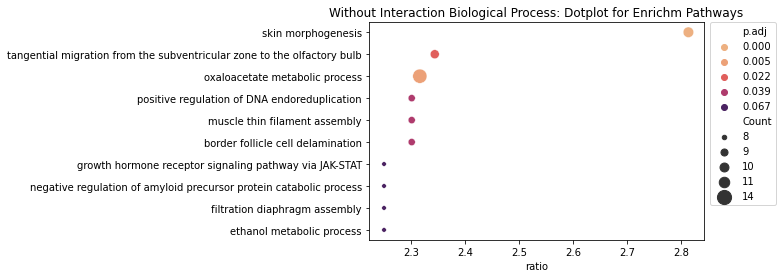

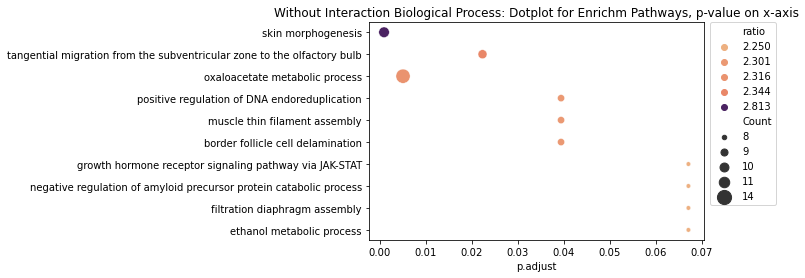

In [33]:
plot_pathways(df_wo_int_pathways, 'Without Interaction')

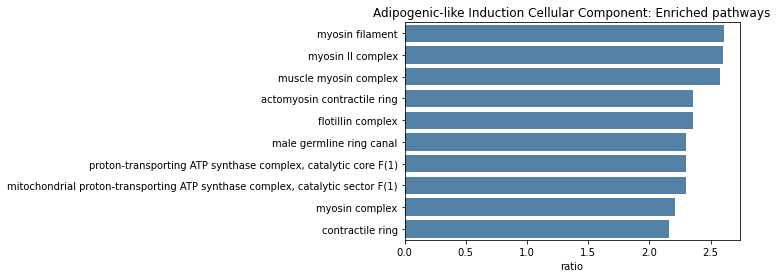

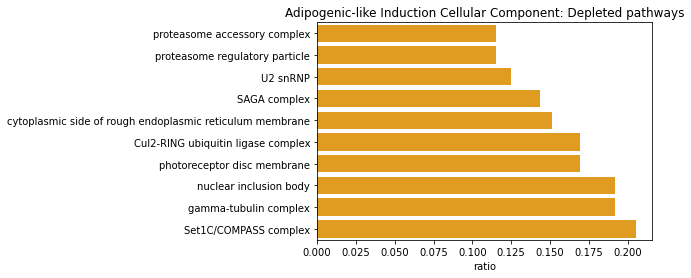

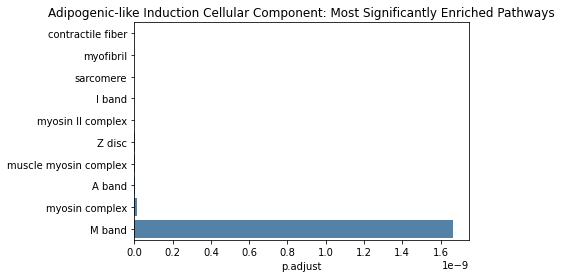

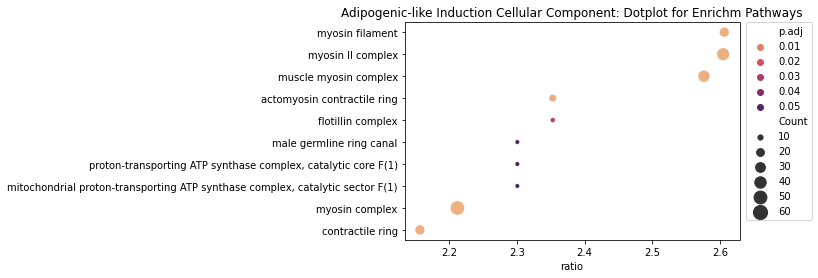

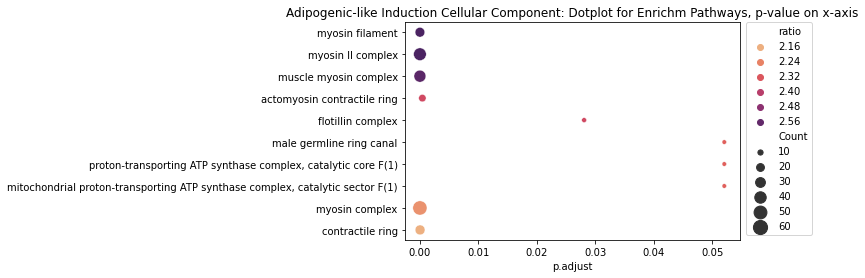

...

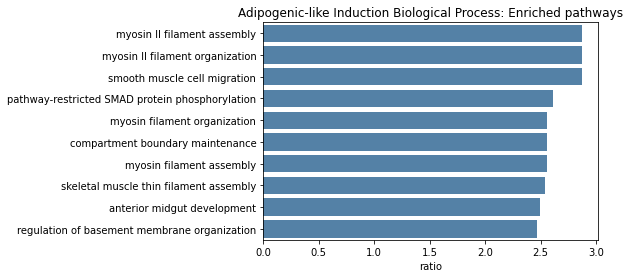

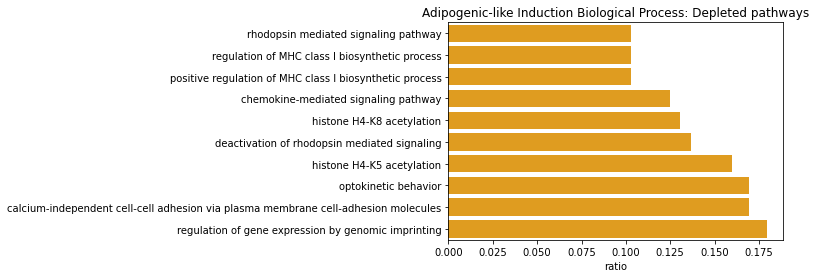

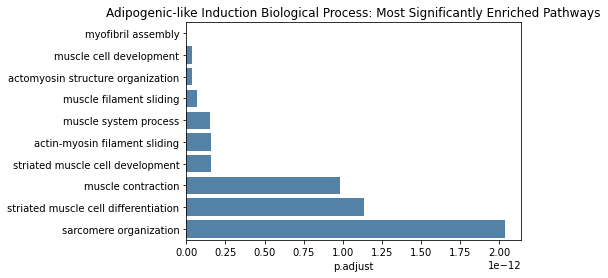

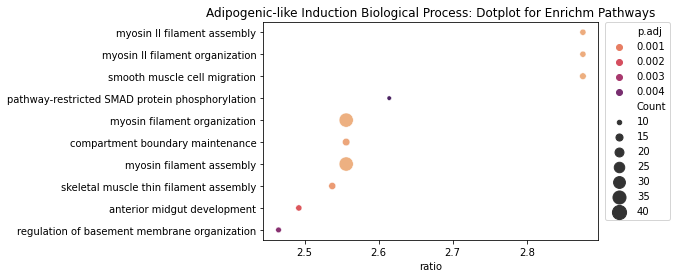

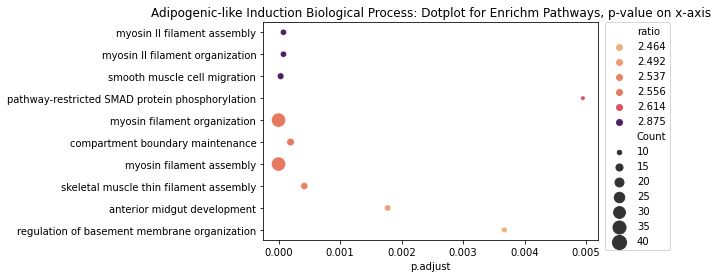

In [34]:
plot_pathways(df_f_pathways, 'Adipogenic-like Induction')

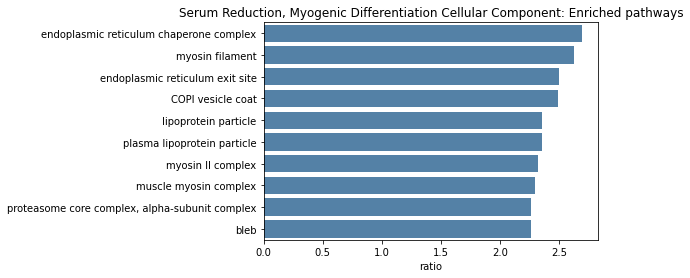

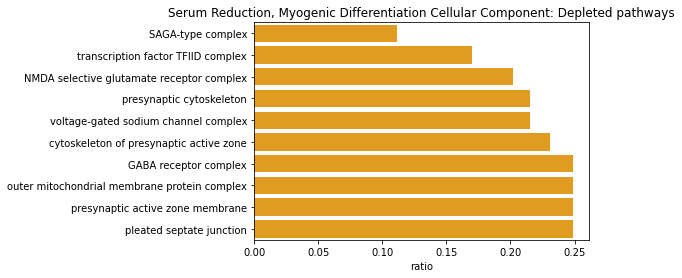

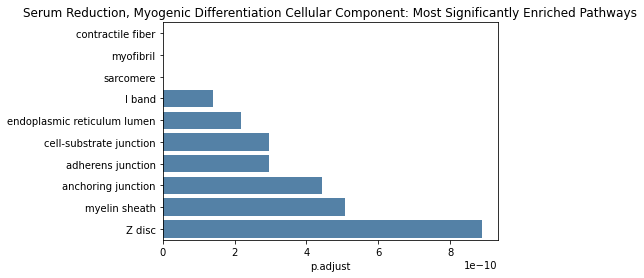

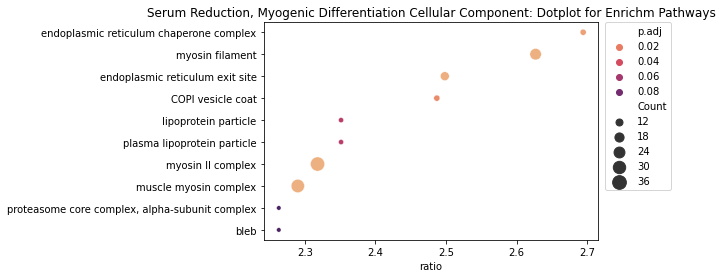

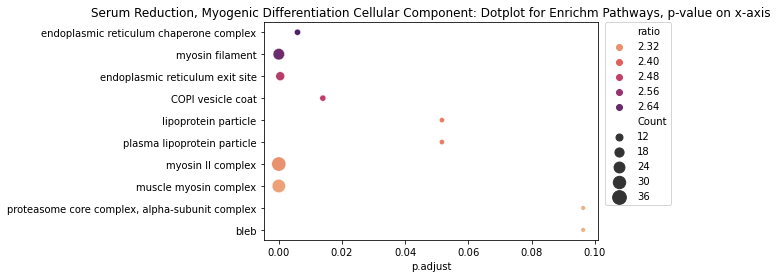

...

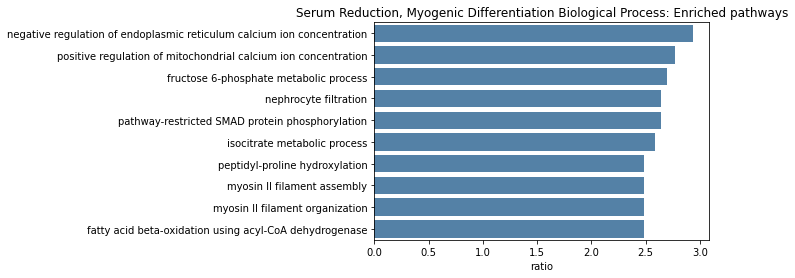

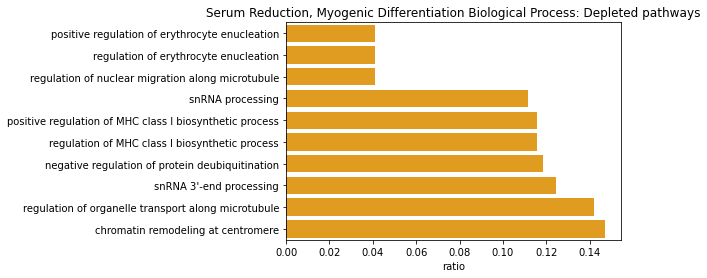

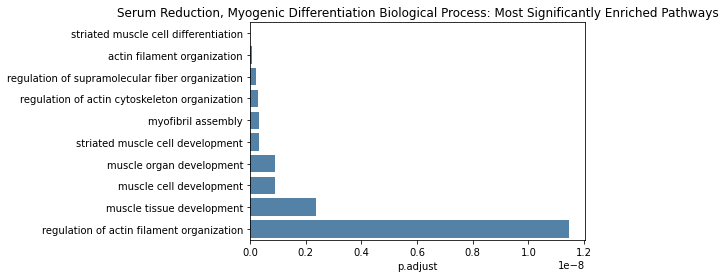

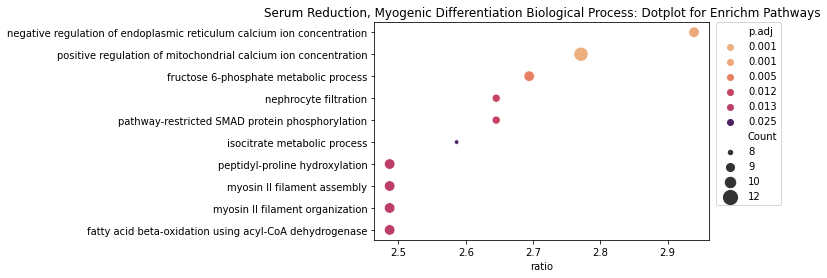

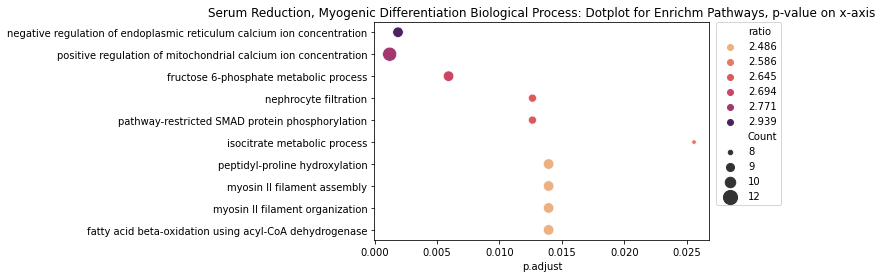

In [35]:
plot_pathways(df_m_pathways, 'Serum Reduction, Myogenic Differentiation')

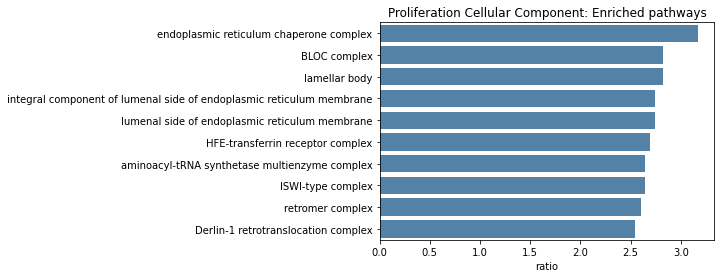

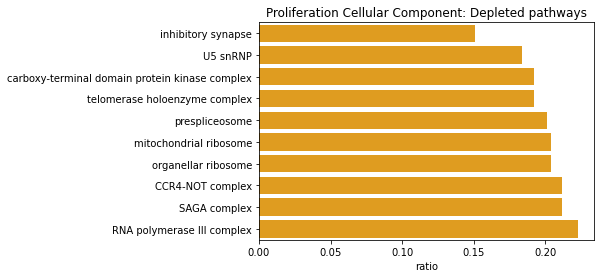

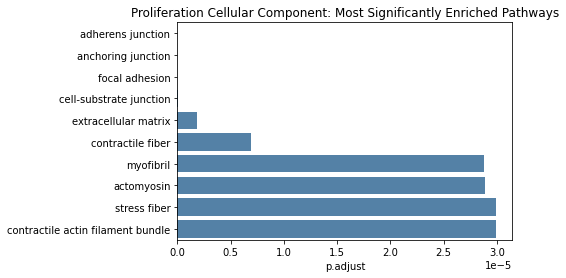

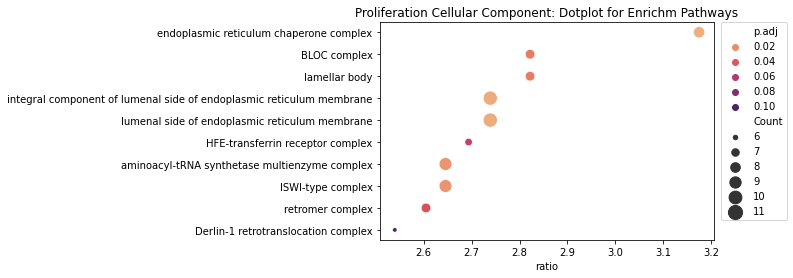

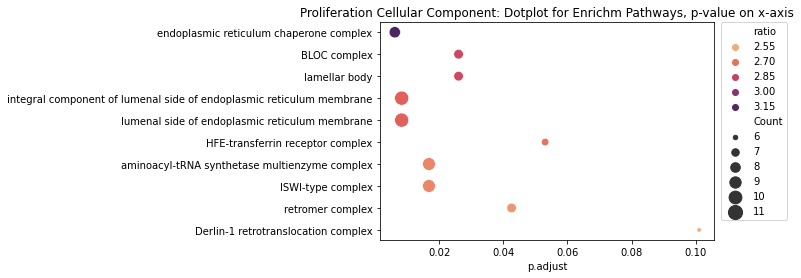

...

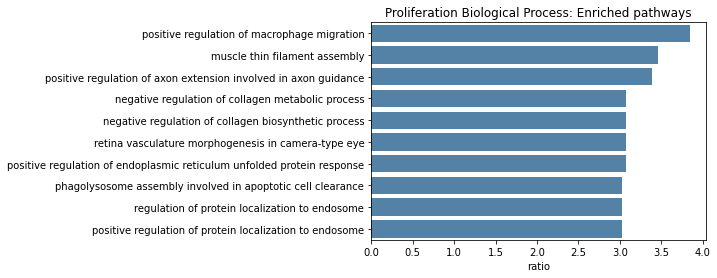

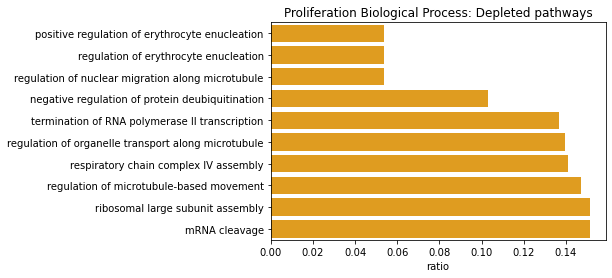

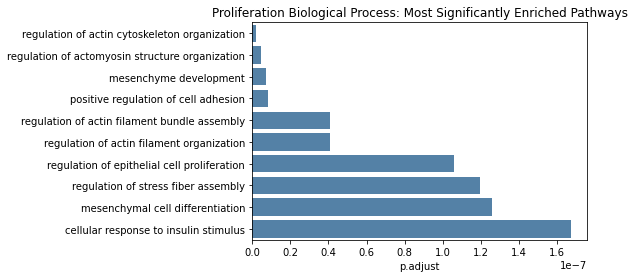

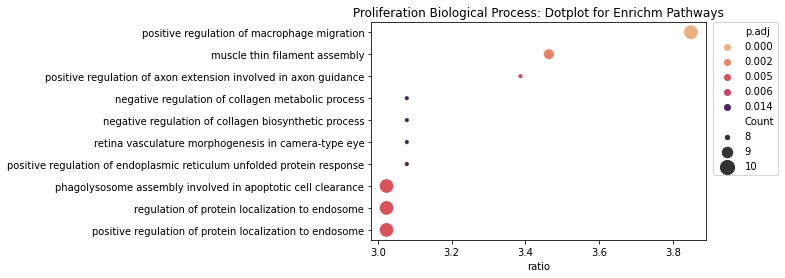

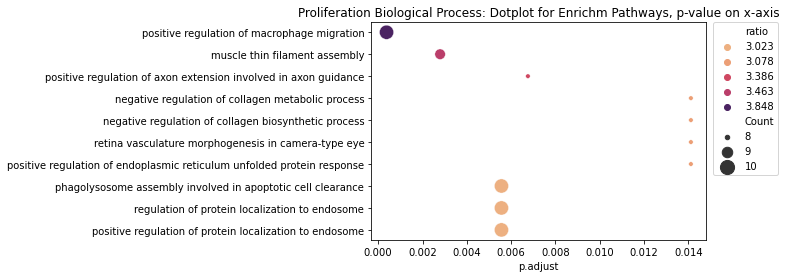

In [36]:
plot_pathways(df_p_pathways, 'Proliferation')

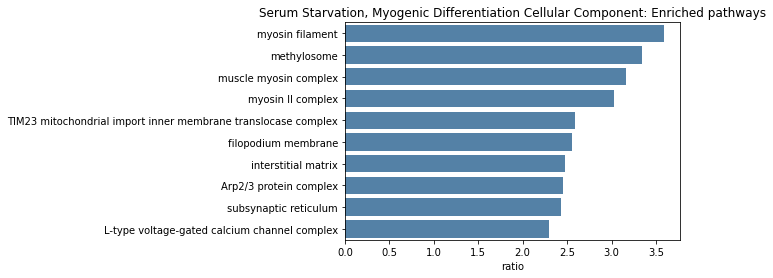

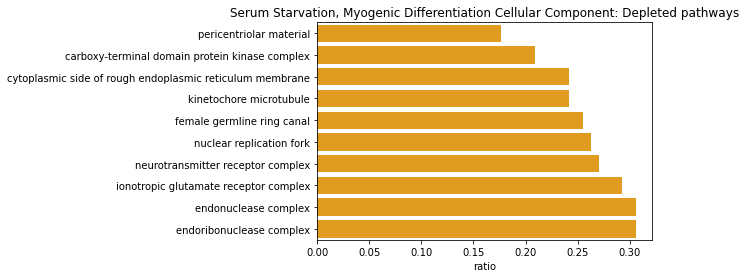

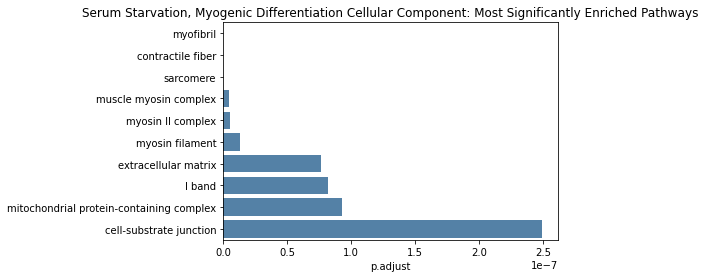

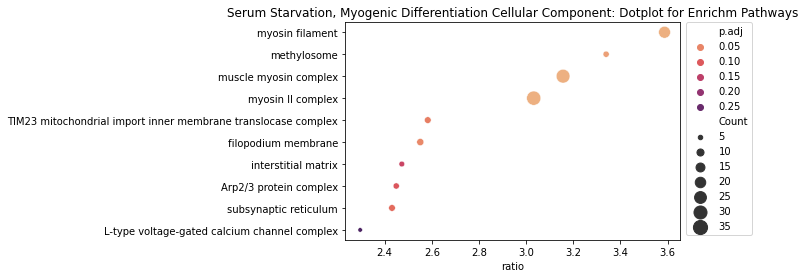

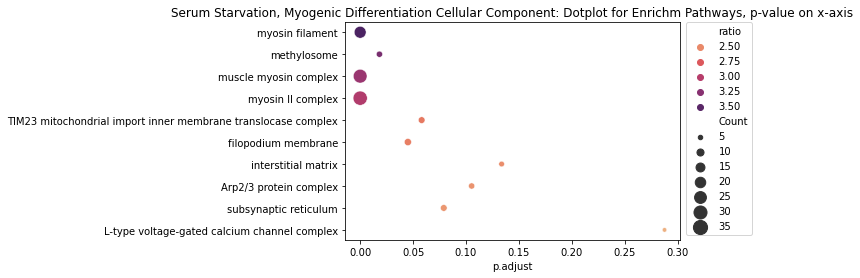

...

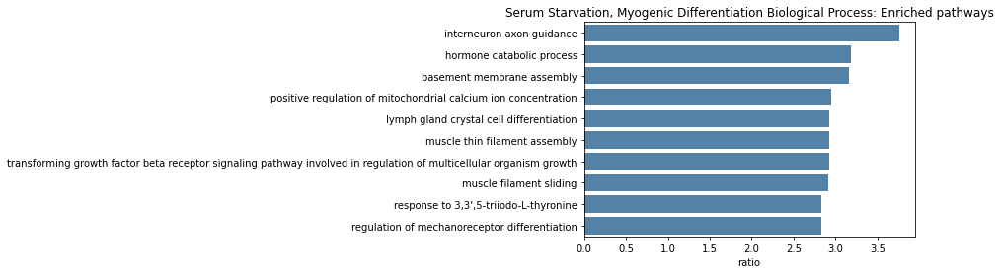

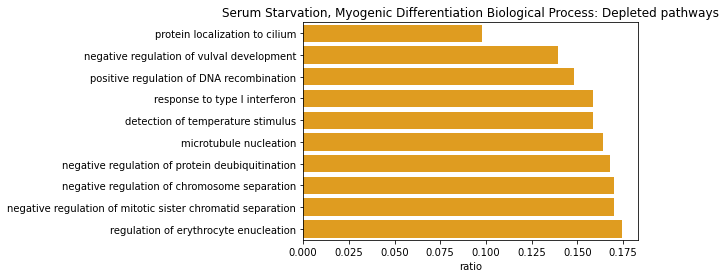

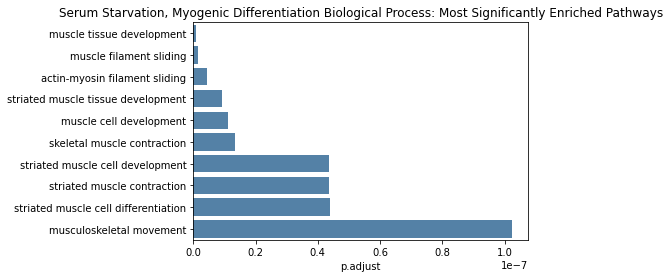

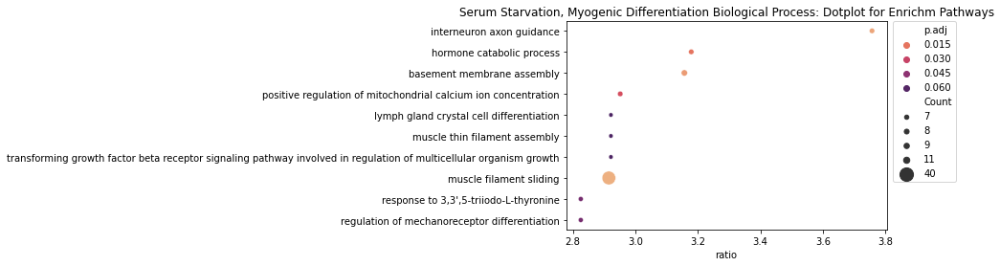

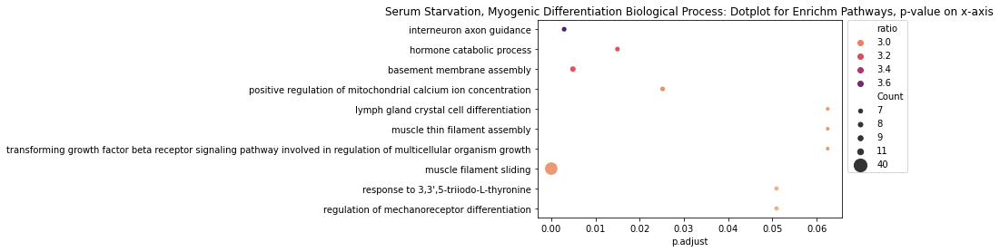

In [37]:
plot_pathways(df_s_pathways, 'Serum Starvation, Myogenic Differentiation')

In [38]:
def plot_kegg(df,label):
    plt.figure()
    sns.barplot(data = df.sort_values("ratio", ascending=False).head(10), x = 'ratio', y = 'category', color = 'steelblue').set(ylabel = None)
    plt.title('%s: Enriched KEGG pathways' % (label))
    plt.show()

    plt.figure()
    sns.barplot(data = df.sort_values("ratio", ascending=True).head(10), x = 'ratio', y = 'category', color = 'orange').set(ylabel = None)
    plt.title('%s: Depleted KEGG pathways' % (label))
    plt.show()

    plt.figure()
    sns.barplot(data = df.sort_values("p.adjust", ascending=True).head(9), x = 'p.adjust', y = 'category', color = 'steelblue').set(ylabel = None)
    plt.title('%s: Most Significantly Enriched KEGG pathways' % (label))
    plt.show()
    
    plt.figure()
    ax = sns.scatterplot(data = df.sort_values("ratio", ascending=False).head(10), 
                x = 'ratio', y = 'category', size = 'Count', hue = 'p.adjust',sizes=(20, 200), palette = 'flare')
    handles, labels = ax.get_legend_handles_labels()
    new_labels = [label[:5] for label in labels]
    ax.legend(handles, new_labels, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    ax.set(ylabel = None)
    plt.title('%s: Dotplot for KEGG Enrichment, ratio on x-axis' % (label))
    plt.show()
    
    plt.figure()
    ax = sns.scatterplot(data = df.sort_values("ratio", ascending=False).head(10), 
                x = 'p.adjust', y = 'category', size = 'Count', hue = 'ratio',sizes=(20, 200), palette = 'flare')

    handles, labels = ax.get_legend_handles_labels()
    new_labels = [label[:5] for label in labels]
    ax.legend(handles, new_labels, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    ax.set(ylabel = None)
    plt.title('%s: Dotplot for KEGG Enrichment, p-value on x-axis' % (label))
    plt.show()

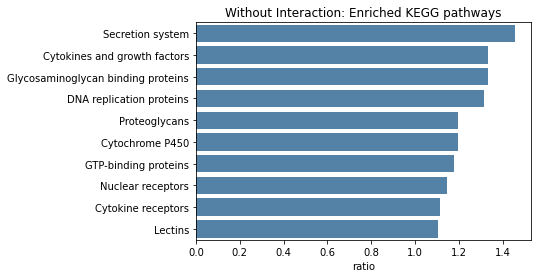

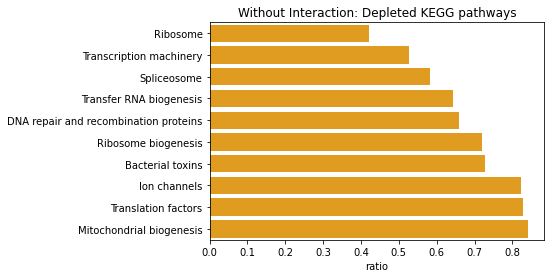

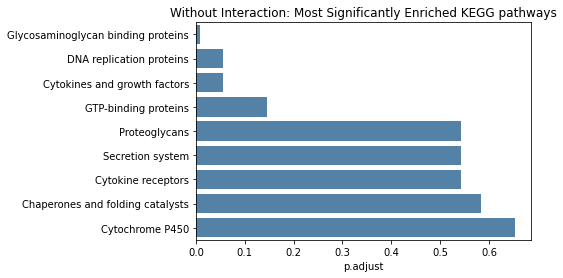

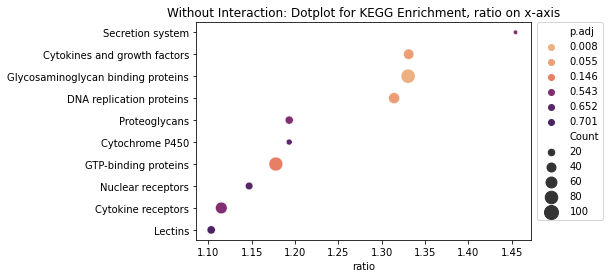

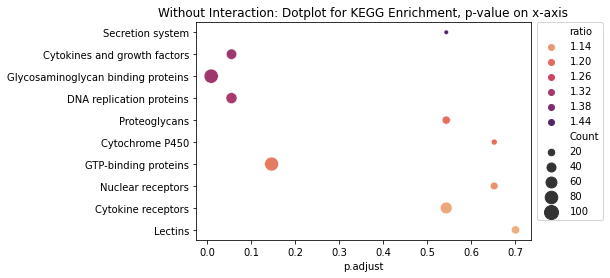

In [39]:
plot_kegg(df_wo_int_kegg, "Without Interaction")

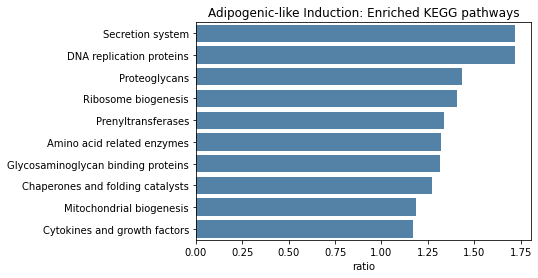

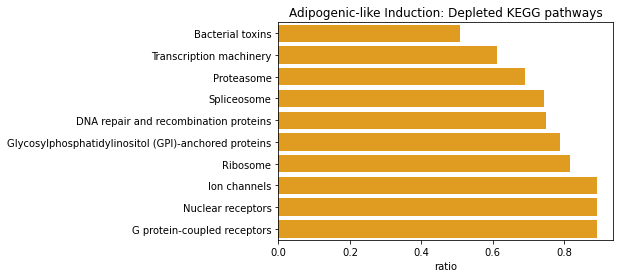

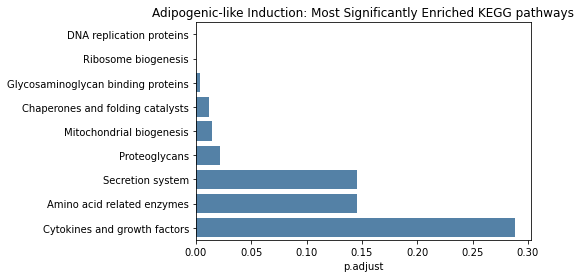

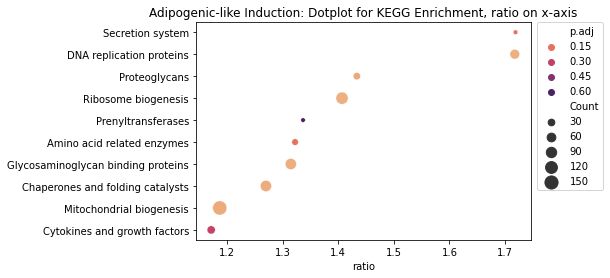

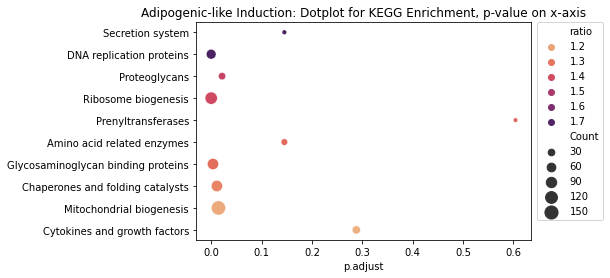

In [40]:
plot_kegg(df_f_kegg, 'Adipogenic-like Induction')

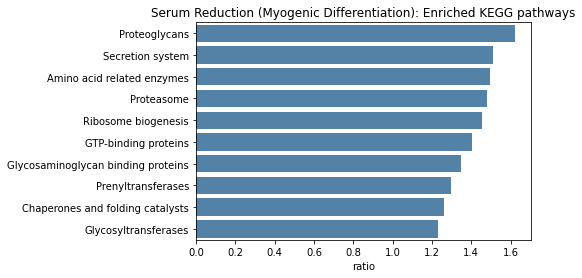

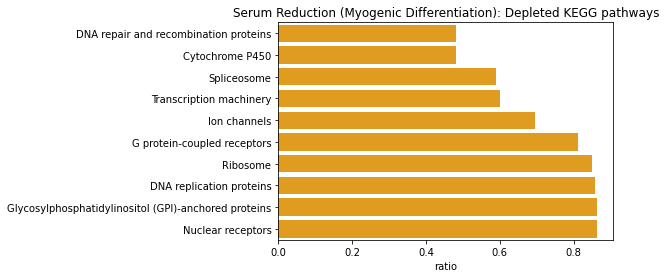

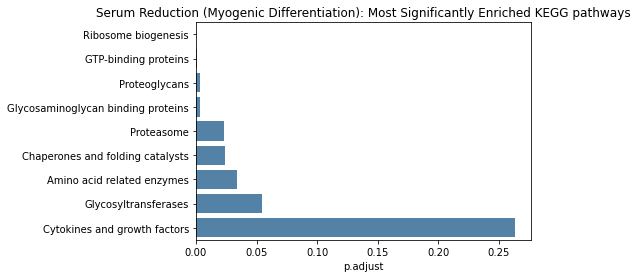

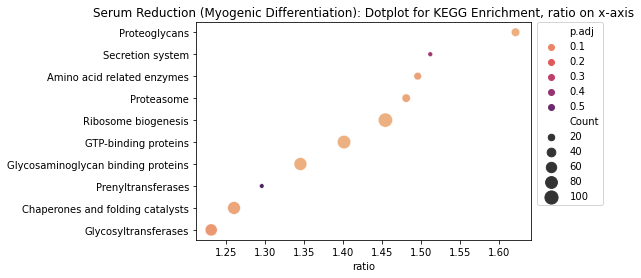

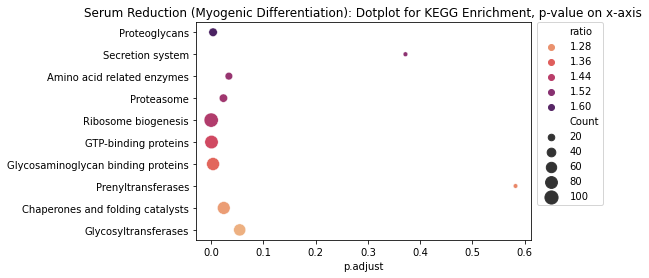

In [41]:
plot_kegg(df_m_kegg, "Serum Reduction (Myogenic Differentiation)")

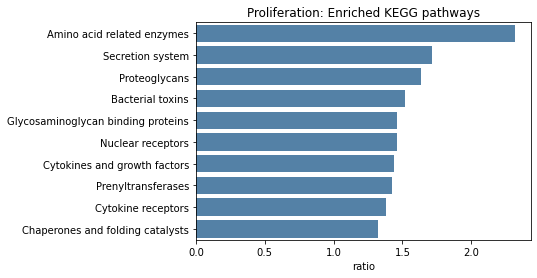

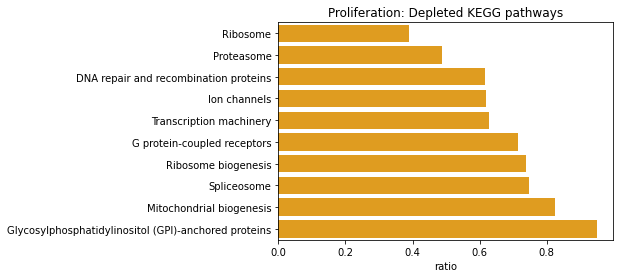

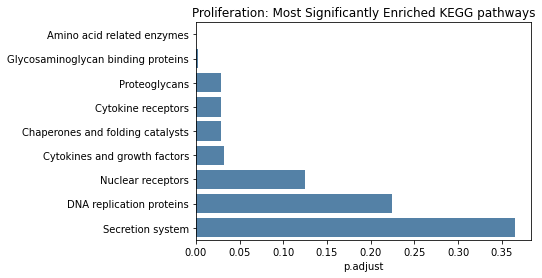

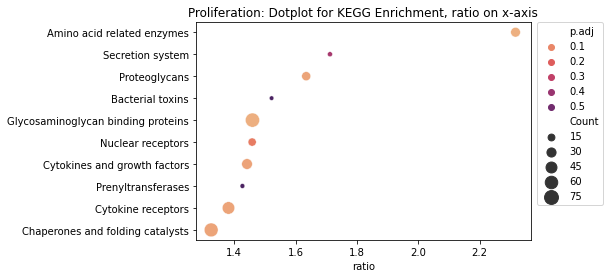

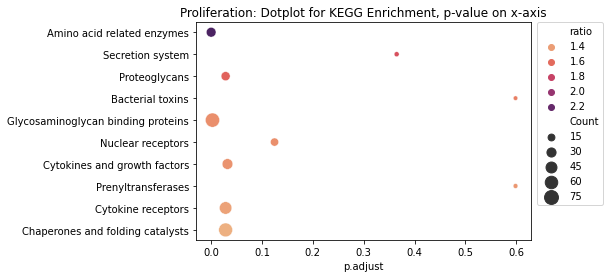

In [42]:
plot_kegg(df_p_kegg,'Proliferation')

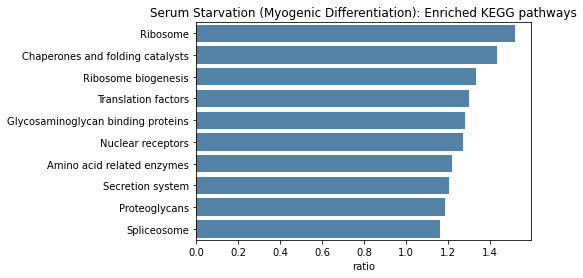

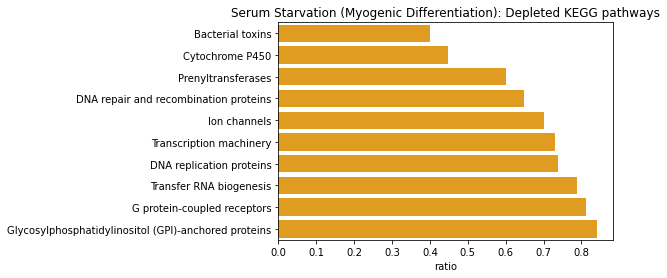

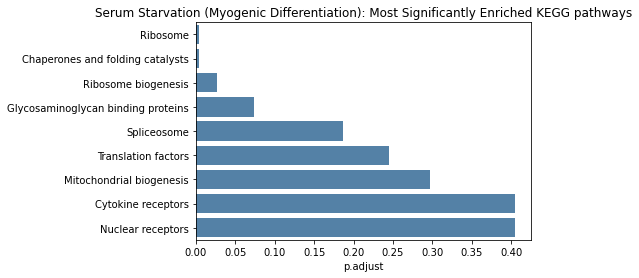

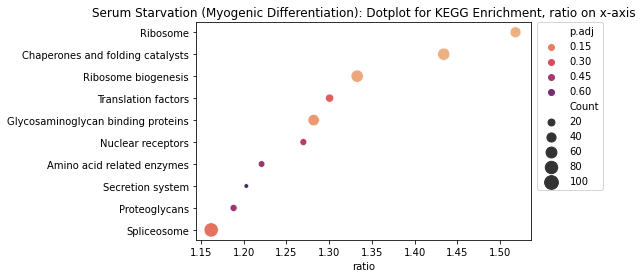

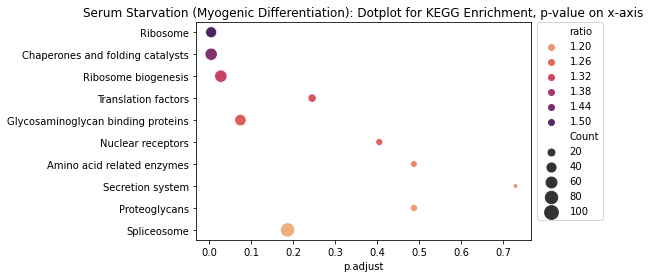

In [43]:
plot_kegg(df_s_kegg,'Serum Starvation (Myogenic Differentiation)')

In [44]:
sig_genes_wo_int = df_wo_int_genes.gene_id[df_wo_int_genes.sig == True]
sig_genes_f = df_f_genes.gene_id[df_f_genes.sig == True]
sig_genes_m = df_m_genes.gene_id[df_m_genes.sig == True]
sig_genes_p = df_p_genes.gene_id[df_p_genes.sig == True]
sig_genes_s = df_s_genes.gene_id[df_s_genes.sig == True]


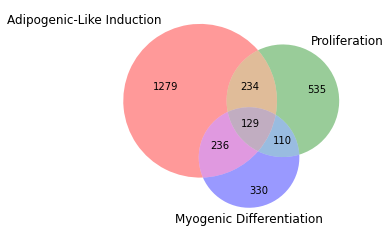

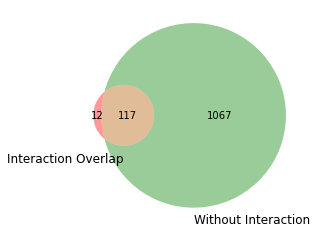

In [45]:
overlap_p27_77 = (set(sig_genes_f).intersection(set(sig_genes_p),set(sig_genes_s)))
overlap_wo_int_p27_p77 = overlap_p27_77.intersection(set(sig_genes_wo_int))
plt.figure()
venn3([set(sig_genes_f), set(sig_genes_p),set(sig_genes_s)],['Adipogenic-Like Induction','Proliferation','Myogenic Differentiation'])
plt.show()

plt.figure()
venn2([overlap_p27_77,set(sig_genes_wo_int)],['Interaction Overlap','Without Interaction'])
plt.show()

In [57]:
# dataframes to send to Carlos

sig_all_no_int = df_wo_int_genes[df_wo_int_genes['adj.P.Val'] < 0.01]
sig_p = df_p_genes[df_p_genes['adj.P.Val'] < 0.01]

constitutive = set(sig_genes_f).intersection(set(sig_genes_p)).intersection(set(sig_genes_m)).intersection(sig_genes_s)
df_constitutive = df_wo_int_genes[df_wo_int_genes.gene_id.isin(constitutive)]


# save as csvs
sig_all_no_int.to_csv('all_sig_without_interaction.csv', header=True)
sig_p.to_csv('sig_only_proliferation.csv', header=True)
df_constitutive.to_csv('intersection_all.csv', header = True)


In [46]:
for i in df_wo_int_genes.description[df_wo_int_genes.gene_id.isin(overlap_p27_77)]:
    print(i)

uncharacterized LOC121904287
leptin a
23 kDa integral membrane protein-like
bone morphogenetic protein 7b
fibulin 1
filamin A interacting protein 1-like
KN motif and ankyrin repeat domain-containing protein 4-like
pentraxin 3, long a
plasminogen activator, tissue
transmembrane protein 200C
versican core protein-like
collectin sub-family member 12
myomegalin-like
NADPH oxidase 4
histone H2A
iodothyronine deiodinase 3a
transmembrane protein 204
uncharacterized si:dkey-112a7.4
kinase non-catalytic C-lobe domain-containing protein 1
phospholipase C like 5
tyrosine aminotransferase
NBL1, DAN family BMP antagonist
platelet-derived growth factor receptor, alpha polypeptide
lysyl oxidase a
olfactomedin-like 3b
leucine-rich repeat-containing protein 17-like
cathepsin H
protocadherin gamma-A2-like
transgelin
actin alpha 2, smooth muscle
proline rich 5a (renal)
quinoid dihydropteridine reductase a
laminin, beta 1b
protocadherin 19
dopamine receptor D2a
target of myb1 membrane trafficking protein


In [47]:
sig_genes_strict_p = df_wo_int_genes.gene_id[df_wo_int_genes['adj.P.Val'] < 0.001]
df_wo_int_pathways.geneID.str.contains('|'.join(sig_genes_strict_p))


0       True
1       True
2       True
3       True
4       True
        ... 
8778    True
8779    True
8780    True
8781    True
8782    True
Name: geneID, Length: 8783, dtype: bool